<a href="https://colab.research.google.com/github/JYJJEON/AIFFEL_Online_Quest/blob/main/Exploration/Exploration1/Exploration1rev1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import warnings
import tensorflow as tf
import tensorflow_datasets as tfds
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, MaxPooling2D
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

warnings.filterwarnings('ignore')

In [2]:
(raw_train, raw_validation, raw_test), metadata = tfds.load(
    name='tf_flowers',
    split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'],
    data_dir='~/tf_flowers/',
    download=True,
    with_info=True,
    as_supervised=True,
)

Dl Completed...:   0%|          | 0/5 [00:00<?, ? file/s]

Dataset tf_flowers downloaded and prepared to /root/tf_flowers/tf_flowers/3.0.1. Subsequent calls will reuse this data.


In [3]:
print(raw_train)
print(raw_validation)
print(raw_test)

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<_PrefetchDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<_PrefetchDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>


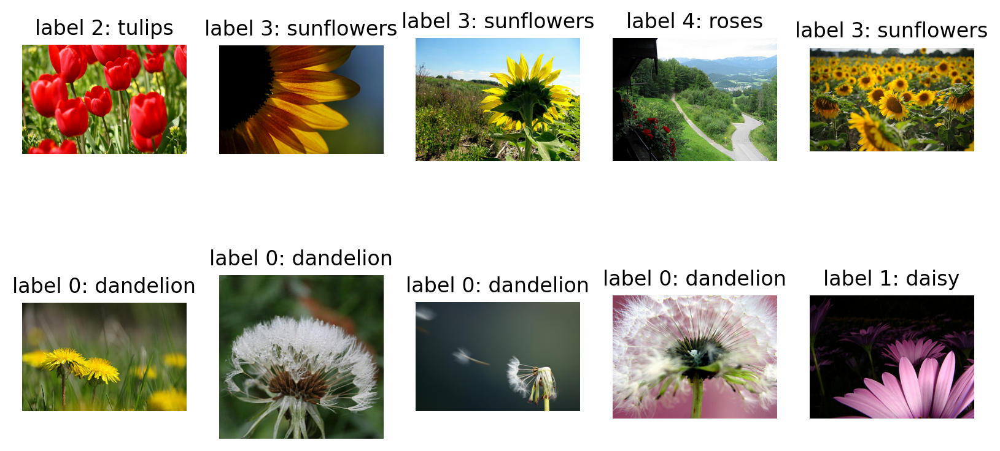

In [4]:
plt.figure(figsize=(10, 5))

get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(raw_train.take(10)):  # 10개의 데이터를 가져 옵니다.
    plt.subplot(2, 5, idx+1)
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

In [5]:
IMG_SIZE = 224 # 리사이징할 이미지의 크기

def format_example(image, label):
    image = tf.cast(image, tf.float32)  # image=float(image)같은 타입캐스팅의  텐서플로우 버전입니다.
    image = (image/127.5) - 1 # 픽셀값의 scale 수정
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
    return image, label

In [6]:
train = raw_train.map(format_example)
validation = raw_validation.map(format_example)
test = raw_test.map(format_example)

print(train)
print(validation)
print(test)

<_MapDataset element_spec=(TensorSpec(shape=(224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<_MapDataset element_spec=(TensorSpec(shape=(224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<_MapDataset element_spec=(TensorSpec(shape=(224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>


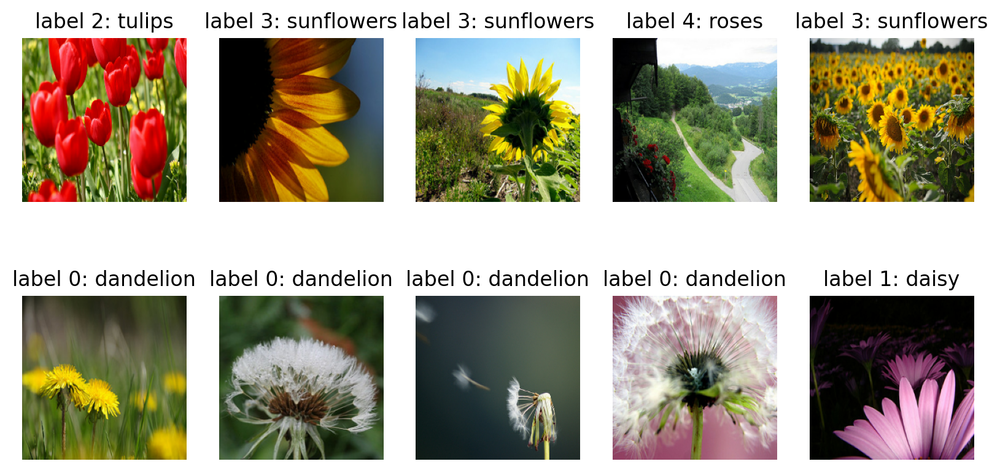

In [7]:
plt.figure(figsize=(10, 5))


get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(train.take(10)):
    plt.subplot(2, 5, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

In [8]:
BATCH_SIZE = 32
SHUFFLE_BUFFER_SIZE = 1000
train_batches = train.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
validation_batches = validation.batch(BATCH_SIZE)
test_batches = test.batch(BATCH_SIZE)

In [9]:
for image_batch, label_batch in train_batches.take(1):
    break

image_batch.shape, label_batch.shape

(TensorShape([32, 224, 224, 3]), TensorShape([32]))

In [10]:
def build_model(num_classes):
    inputs = tf.keras.layers.Input(shape=(IMG_SIZE, IMG_SIZE, 3))
    x = inputs
    model = tf.keras.applications.VGG16(include_top=False, input_tensor=x, weights="imagenet")

    # Freeze the pretrained weights
    model.trainable = False

    # Rebuild top
    x = tf.keras.layers.GlobalAveragePooling2D(name="avg_pool")(model.output)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Dropout(0.5)(x)  # Added Dropout with 50% dropout rate
    x = tf.keras.layers.Dense(256, activation='relu')(x)
    outputs = tf.keras.layers.Dense(num_classes, activation="softmax", name="pred")(x)

    # Compile
    model = tf.keras.Model(inputs, outputs, name="EfficientNet")
    optimizer = tf.keras.optimizers.Adam(learning_rate=1e-2)
    model.compile(
        optimizer=optimizer, loss="sparse_categorical_crossentropy", metrics=["accuracy"]
    )
    return model

In [11]:
model = build_model(num_classes=5)

58889256/58889256 [==============================] - 2s 0us/step


In [12]:
model.summary()

Model: "EfficientNet"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)      

In [13]:
EPOCHS = 45
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data = validation_batches)

Epoch 1/45
92/92 [==============================] - 34s 217ms/step - loss: 1.3026 - accuracy: 0.6717 - val_loss: 1.2421 - val_accuracy: 0.6894
Epoch 2/45
92/92 [==============================] - 15s 157ms/step - loss: 0.7053 - accuracy: 0.7531 - val_loss: 1.1711 - val_accuracy: 0.5531
Epoch 3/45
92/92 [==============================] - 15s 159ms/step - loss: 0.6268 - accuracy: 0.7847 - val_loss: 0.9692 - val_accuracy: 0.7193
Epoch 4/45
92/92 [==============================] - 14s 153ms/step - loss: 0.5726 - accuracy: 0.7994 - val_loss: 0.7119 - val_accuracy: 0.7902
Epoch 5/45
92/92 [==============================] - 14s 150ms/step - loss: 0.5433 - accuracy: 0.8045 - val_loss: 0.6252 - val_accuracy: 0.7902
Epoch 6/45
92/92 [==============================] - 14s 149ms/step - loss: 0.5175 - accuracy: 0.8205 - val_loss: 0.5735 - val_accuracy: 0.7956
Epoch 7/45
92/92 [==============================] - 14s 152ms/step - loss: 0.5197 - accuracy: 0.8232 - val_loss: 0.6068 - val_accuracy: 0.7820

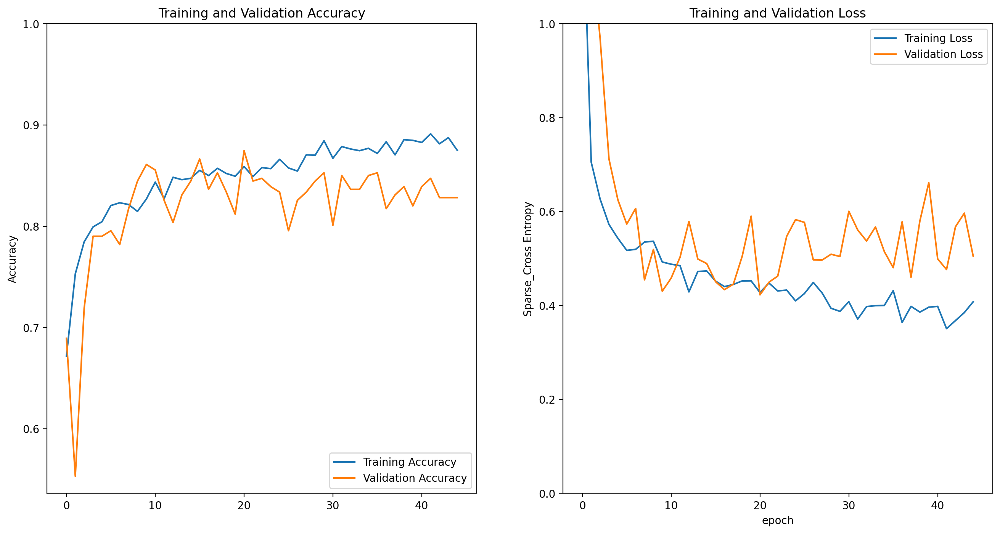

In [21]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Sparse_Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [22]:
for image_batch, label_batch in test_batches.take(3):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions

1/1 [==============================] - 0s 28ms/step


array([[1.00000000e+00, 3.35504176e-08, 6.07592210e-13, 1.61586813e-10,
        1.38928647e-12],
       [6.75901771e-02, 5.04058003e-01, 8.38290751e-02, 1.39895707e-01,
        2.04626992e-01],
       [4.04701149e-03, 4.77734138e-04, 3.41127301e-03, 9.83040869e-01,
        9.02313460e-03],
       [6.98512595e-05, 7.16001668e-04, 9.89170849e-01, 4.82560339e-04,
        9.56086162e-03],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 1.00000000e+00,
        0.00000000e+00],
       [8.42407718e-02, 3.71630420e-03, 1.55900989e-06, 9.12014067e-01,
        2.73203168e-05],
       [2.09385542e-13, 8.91671320e-11, 1.00000000e+00, 1.15374985e-14,
        4.70468331e-09],
       [2.96015362e-03, 2.56385608e-03, 6.75603390e-01, 1.17916232e-02,
        3.07080954e-01],
       [1.28930788e-13, 8.73913741e-09, 4.27137449e-04, 1.78075754e-09,
        9.99572814e-01],
       [1.64925437e-02, 6.91836774e-02, 4.75799948e-01, 6.19972423e-02,
        3.76526564e-01],
       [1.00000000e+00, 8.7354

In [24]:
import numpy as np
predictions = np.argmax(predictions, axis=1)
predictions

array([0, 1, 3, 2, 3, 3, 2, 2, 4, 2, 0, 3, 1, 1, 4, 0, 4, 4, 1, 4, 0, 3,
       2, 2, 4, 1, 2, 0, 1, 1, 3, 3])

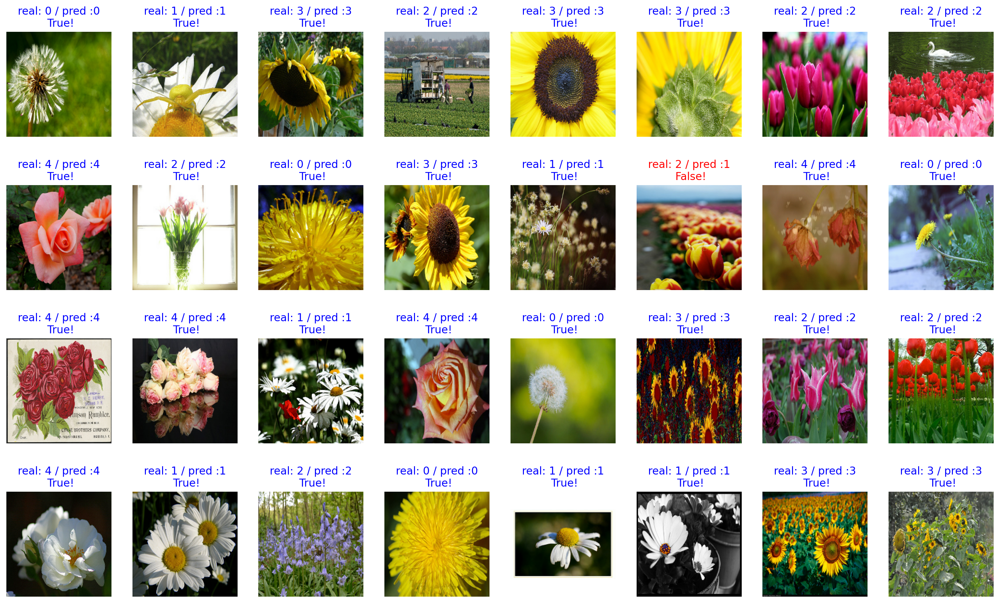

In [25]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [26]:
count = 0
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count = count + 1

print(count / 32 * 100) # 약 96% 내외

96.875


In [27]:
import os

checkpoint_dir = "C:\\Users\\james\\tf_flowers\\checkpoint"
checkpoint_file_path = os.path.join(checkpoint_dir, 'checkpoint')

if not os.path.exists('checkpoint_dir'):
    os.mkdir('checkpoint_dir')

model.save_weights(checkpoint_file_path)     # checkpoint 파일 생성

if os.path.exists(checkpoint_file_path):
  print('checkpoint 파일 생성 OK!!')

checkpoint 파일 생성 OK!!


In [28]:
# Initialize variables to hold predictions and labels
all_predictions = []
all_labels = []

# Loop over each batch of data
for image_batch, label_batch in test_batches:
    # Make predictions
    predictions = model.predict(image_batch)
    all_predictions.append(predictions)
    all_labels.append(label_batch.numpy())

# Concatenate all the predictions and labels into single arrays
all_predictions = np.concatenate(all_predictions, axis=0)
all_labels = np.concatenate(all_labels, axis=0)

# Convert probabilities to integer labels
predicted_labels = np.argmax(all_predictions, axis=1)

# Your labels are already integers
true_labels = all_labels

# Calculate accuracy
accuracy = np.mean(predicted_labels == true_labels)
print(f'Test accuracy: {accuracy * 100:.2f}%')


1/1 [==============================] - 0s 23ms/step
Test accuracy: 88.83%
